In [1]:
# Import all the things we need ---
#   by setting env variables before Keras import you can set up which backend and which GPU it uses
%matplotlib inline
import os,random
os.environ["KERAS_BACKEND"] = "theano"
#os.environ["KERAS_BACKEND"] = "tensorflow"
os.environ["THEANO_FLAGS"]  = "device=cuda"
import numpy as np
import theano as th
import theano.tensor as T
from keras.utils import np_utils
from keras.utils import to_categorical
import keras.models as models
from keras.layers.core import Reshape,Dense,Dropout,Activation,Flatten
from keras.layers.noise import GaussianNoise
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.layers.convolutional import Conv2D
from keras.regularizers import *
from keras.optimizers import adam
import matplotlib.pyplot as plt
import seaborn as sns
import  random, sys, keras
import _pickle as cPickle

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
/root/anaconda3/envs/py37tf114/lib/python3.7/site-packages/theano/gpuarray/dnn.py:184: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to a version >= v5 and <= v7.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 7602 on context None
Mapped name None to device cuda: GeForce GTX 1660 Ti (0000:01:00.0)
Using Theano backend.


In [2]:
#dictionary형태의 Xd를 IQ_value를 가진 array형태의 X를 만든다
Xd_impulse = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_default.dat",'rb'),encoding="latin1")
print(Xd_impulse)
snrs_impulse,mods_impulse = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_impulse.keys())))), [1,0])
X_impulse = [] 
lbl_impulse = []
for mod in mods_impulse:
    for snr in snrs_impulse:
            X_impulse.append(Xd_impulse[(mod,snr)])
            for i in range(Xd_impulse[(mod,snr)].shape[0]):  
                lbl_impulse.append((mod,snr))
X_impulse = np.vstack(X_impulse)
print(X_impulse.shape)

#arrayX에서 random하게 index를 뽑아 X_train과 X_test를 만든다
np.random.seed(2016)
n_examples = X_impulse.shape[0]
n_train = int(n_examples * 0.5)
train_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
test_idx = list(set(range(0,n_examples))-set(train_idx))
X_train = X_impulse[train_idx]
X_test =  X_impulse[test_idx]
def to_onehot(yy):
    yy1 = np.zeros([len(yy), max(yy)+1])
    yy1[np.arange(len(yy)),yy] = 1
    return yy1
Y_train = to_onehot(list(map(lambda x: mods_impulse.index(lbl_impulse[x][0]), train_idx)))
Y_test = to_onehot(list(map(lambda x: mods_impulse.index(lbl_impulse[x][0]), test_idx)))

{('AM-SSB', 3): array([[[-7.00879749e-03, -3.31731484e-04,  6.40119286e-03, ...,
         -5.38636371e-03,  2.61528185e-04,  2.60907924e-03],
        [ 3.31414468e-03,  2.07363279e-03, -6.28321851e-03, ...,
          5.40848030e-03, -1.31049277e-02,  3.39283515e-03]],

       [[-2.98872893e-03,  3.85068962e-03,  3.00657167e-03, ...,
          6.04059827e-03, -2.35577370e-03, -2.52736527e-02],
        [-1.24184671e-03, -4.88221366e-03,  9.18051973e-03, ...,
          1.77767128e-02, -4.76245955e-03,  9.12199263e-03]],

       [[ 3.05470009e-03,  5.65177761e-03,  3.77525319e-03, ...,
          5.10681281e-03, -1.66346820e-03, -7.98444543e-03],
        [ 6.38916902e-03,  4.17638337e-03,  7.09370477e-03, ...,
          7.41937291e-03,  8.04584194e-03,  4.95076412e-03]],

       ...,

       [[-1.02445465e-02, -1.48586766e-03, -1.56181986e-02, ...,
          9.72262584e-04, -1.13666598e-02,  3.83690186e-03],
        [-1.58967159e-03, -4.62038023e-03, -3.25291604e-03, ...,
          1.259339

In [3]:
in_shp = list(X_train.shape[1:])
print(mods_impulse, snrs_impulse)
print(X_train.shape, in_shp)
classes = mods_impulse

['8PSK', 'AM-DSB', 'AM-SSB', 'BPSK', 'CPFSK', 'GFSK', 'PAM4', 'QAM16', 'QAM64', 'QPSK', 'WBFM'] [-5, -3, -1, 1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29]
(40689, 2, 128) [2, 128]


In [4]:
#model 만들기

dr = 0.5 
model = models.Sequential()
model.add(Reshape(in_shp+[1], input_shape=in_shp))
model.add(ZeroPadding2D((0,2)))
model.add(Conv2D(64, (1,4), activation="relu"))
model.add(Dropout(dr))
model.add(ZeroPadding2D((0,2)))
model.add(Conv2D(64, (2,4), activation="relu"))
model.add(Dropout(dr))
model.add(Conv2D(128, (1,8), activation="relu"))
model.add(Dropout(dr))
model.add(Conv2D(128, (1,8), activation="relu"))
model.add(Dropout(dr))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(dr))
model.add(Dense(len(classes), activation='softmax'))
model.add(Reshape([len(classes)]))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          (None, 2, 128, 1)         0         
_________________________________________________________________
zero_padding2d_1 (ZeroPaddin (None, 2, 132, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 2, 129, 64)        320       
_________________________________________________________________
dropout_1 (Dropout)          (None, 2, 129, 64)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 2, 133, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 130, 64)        32832     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 130, 64)       

In [5]:
nb_epoch =30     # number of epochs to train on
batch_size = 400  # training batch size

In [6]:
#training

filepath = 'convmodrecnets_CNN2_0.5.wts.h5'
history = model.fit(X_train,
    Y_train,
    batch_size=batch_size,
    epochs=nb_epoch,
    verbose=2,
    validation_data=(X_test, Y_test),
    callbacks = [
        keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto'),
        keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='auto')
    ])
# we re-load the best weights once training is finished
model.load_weights(filepath)

Train on 40689 samples, validate on 40689 samples
Epoch 1/30
 - 8s - loss: 1.9175 - accuracy: 0.2644 - val_loss: 1.3525 - val_accuracy: 0.4690

Epoch 00001: val_loss improved from inf to 1.35254, saving model to convmodrecnets_CNN2_0.5.wts.h5
Epoch 2/30
 - 8s - loss: 1.2750 - accuracy: 0.4842 - val_loss: 1.0737 - val_accuracy: 0.5503

Epoch 00002: val_loss improved from 1.35254 to 1.07366, saving model to convmodrecnets_CNN2_0.5.wts.h5
Epoch 3/30
 - 8s - loss: 1.0937 - accuracy: 0.5446 - val_loss: 0.9217 - val_accuracy: 0.6189

Epoch 00003: val_loss improved from 1.07366 to 0.92169, saving model to convmodrecnets_CNN2_0.5.wts.h5
Epoch 4/30
 - 8s - loss: 0.8843 - accuracy: 0.6244 - val_loss: 0.6950 - val_accuracy: 0.6634

Epoch 00004: val_loss improved from 0.92169 to 0.69500, saving model to convmodrecnets_CNN2_0.5.wts.h5
Epoch 5/30
 - 8s - loss: 0.7504 - accuracy: 0.6650 - val_loss: 0.6327 - val_accuracy: 0.6858

Epoch 00005: val_loss improved from 0.69500 to 0.63273, saving model to 

In [7]:
score = model.evaluate(X_test, Y_test, verbose=0, batch_size=batch_size)
print (score)

[0.3873458519988623, 0.8030917644500732]


In [8]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Reds, labelsA=[], labelsB=[]):
    #plt.cm.Reds - color shades to use, Reds, Blues, etc.
    # made the image bigger- 800x800
    #my_dpi=250
    
    #plt.figure(figsize=(800/my_dpi, 800/my_dpi), dpi=my_dpi)
    #key call- data, how to interpolate thefp vakues, color map
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    #adds a color legend to right hand side. Shows values for different shadings of blue.
    plt.colorbar()
    # create tickmarks with count = number of labels
    tick_marks = np.arange(len(labelsB))
    plt.xticks(tick_marks, labelsA, rotation=45)
    plt.yticks(tick_marks, labelsB)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

test_X_i.shape[0] :  2289
count :  1266
test_X_i.shape[0] :  2263
count :  1648
test_X_i.shape[0] :  2271
count :  1801
test_X_i.shape[0] :  2311
count :  1809
test_X_i.shape[0] :  2264
count :  1940
test_X_i.shape[0] :  2268
count :  1919
test_X_i.shape[0] :  2192
count :  1872
test_X_i.shape[0] :  2285
count :  1749
test_X_i.shape[0] :  2241
count :  1829
test_X_i.shape[0] :  2251
count :  1808
test_X_i.shape[0] :  2244
count :  1755
test_X_i.shape[0] :  2302
count :  1965
test_X_i.shape[0] :  2274
count :  1873
test_X_i.shape[0] :  2199
count :  1813
test_X_i.shape[0] :  2235
count :  1884
test_X_i.shape[0] :  2272
count :  1972
test_X_i.shape[0] :  2217
count :  1826
test_X_i.shape[0] :  2311
count :  1948


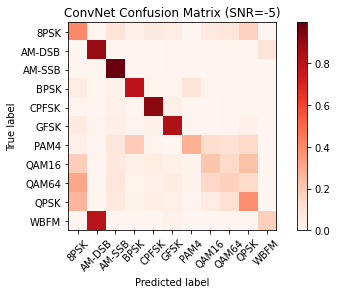

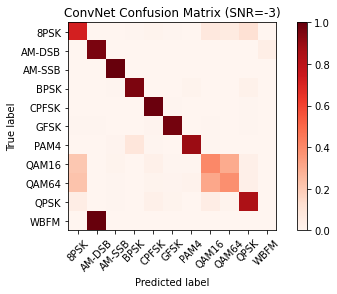

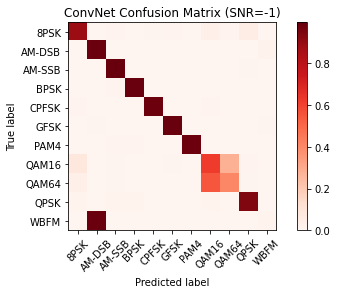

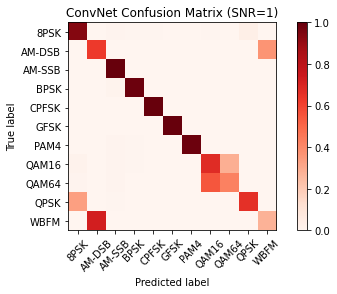

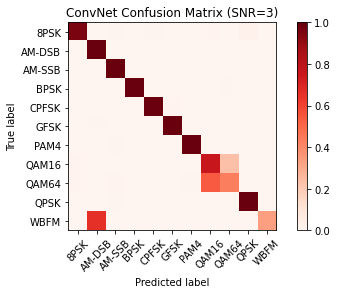

...

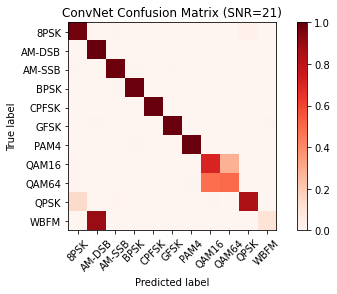

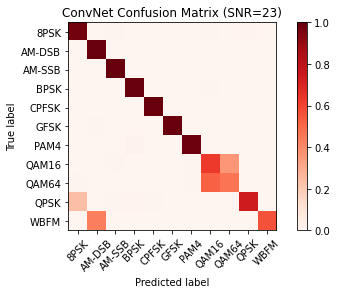

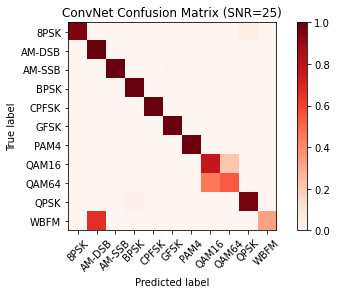

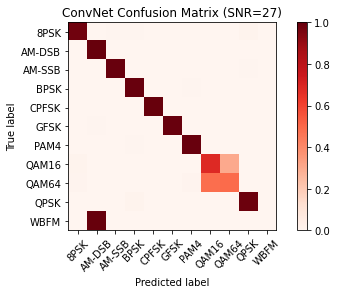

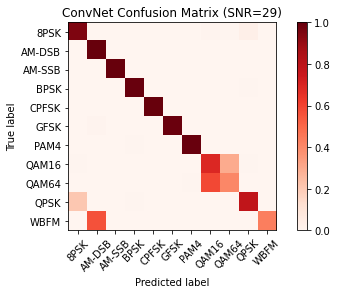

In [9]:
# Plot confusion matrix
acc = {}
count=0
#this create a new confusion matrix for each SNR
for snr in snrs_impulse:
    # extract classes @ SNR
    # USRP_IQ data를 snr에 따라서 배열한다
    test_SNRs = list(map(lambda x: lbl_impulse[x][1], test_idx))
    test_X_i = X_test[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = Y_test[np.where(np.array(test_SNRs)==snr)]    
 
    # USRP_IQ data의 class를 예측힌다
    test_Y_i_hat = model.predict(test_X_i)

    #create 11x11 matrix full of zeroes
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    print("test_X_i.shape[0] : ", test_X_i.shape[0])
    for i in range(0,test_X_i.shape[0]):
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        '''
        print('j : ', j)
        print('k : ', k)
        '''
        conf[j,k] = conf[j,k] + 1
        if k==j:
            count=count+1
    print("count : ", count)
    count=0
    
    #normalize 0 .. 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    plt.figure()
    
    plot_confusion_matrix(confnorm, labelsA=classes,labelsB=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
 
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    acc[snr] = 1.0*cor/(cor+ncor)


In [10]:
score = model.evaluate(X_test, Y_test, verbose=0, batch_size=batch_size)
print (score)

[0.3873458519988623, 0.8030917644500732]


In [11]:
Xd_1 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_0.5.dat",'rb'),encoding="latin1")
print(Xd_1)
snrs_1,mods_1 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_1.keys())))), [1,0])
X_1 = [] 
lbl_1 = []
for mod in mods_1:
    for snr in snrs_1:
            X_1.append(Xd_1[(mod,snr)])
            for i in range(Xd_1[(mod,snr)].shape[0]):  
                lbl_1.append((mod,snr))
X_1 = np.vstack(X_1)
print(X_1.shape)

#arrayX에서 random하게 index를 뽑아 X_train과 X_test를 만든다
np.random.seed(2016)
n_examples = X_1.shape[0]
n_train = int(n_examples * 0.5)
test_1_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
X_1_test =  X_1[test_1_idx]
def to_onehot(yy):
    yy1 = np.zeros([len(yy), max(yy)+1])
    yy1[np.arange(len(yy)),yy] = 1
    return yy1

Y_1_test = to_onehot(list(map(lambda x: mods_1.index(lbl_1[x][0]), test_1_idx)))

{('AM-SSB', 3): array([[[-0.00715572,  0.01795012, -0.00065241, ..., -0.02361007,
         -0.01278867,  0.02781371],
        [ 0.00163042,  0.02193015, -0.01594925, ...,  0.01182495,
         -0.01127106,  0.01484387]],

       [[-0.00920178,  0.00460662, -0.00934488, ...,  0.00311581,
          0.01389125,  0.0093148 ],
        [-0.0034884 , -0.00318972, -0.01240827, ..., -0.00268677,
         -0.01029586, -0.02350642]],

       [[ 0.00603478, -0.020897  ,  0.00055075, ...,  0.01282742,
         -0.00217193,  0.0261818 ],
        [-0.02482632,  0.00330537, -0.00449922, ..., -0.00746269,
          0.00852632, -0.01102343]],

       ...,

       [[-0.00434958,  0.00932573, -0.02186535, ..., -0.0114284 ,
         -0.00281534, -0.00855016],
        [-0.0073374 ,  0.00589778,  0.01196145, ..., -0.01454172,
         -0.00186585,  0.00930947]],

       [[-0.02751578,  0.00564719,  0.00361922, ..., -0.01492976,
          0.00750637,  0.01567313],
        [ 0.0099254 ,  0.02890434,  0.0034210

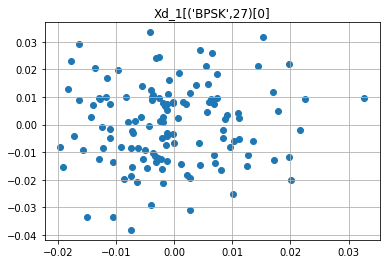

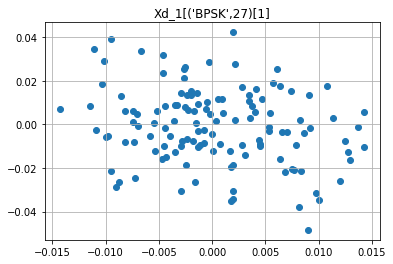

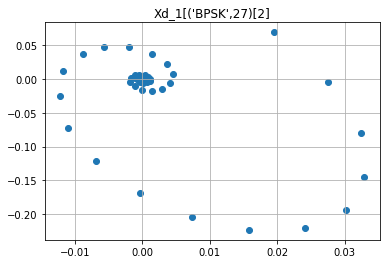

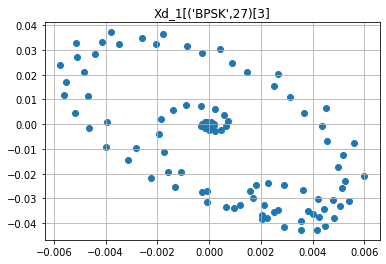

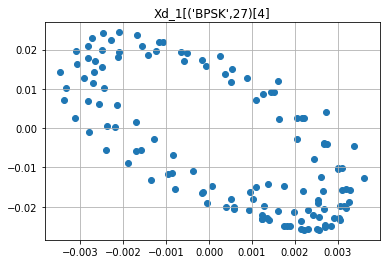

...

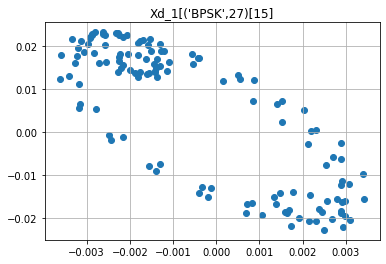

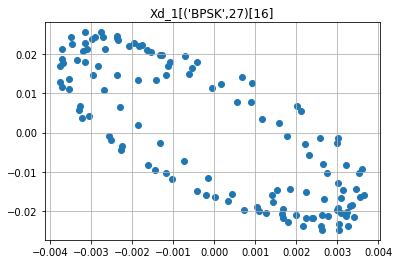

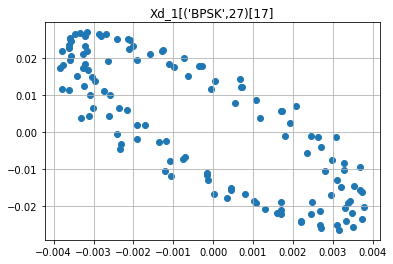

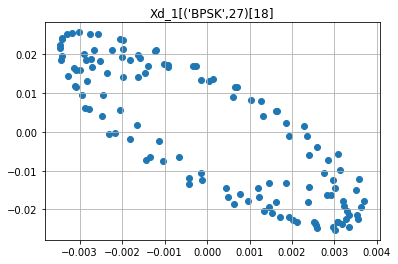

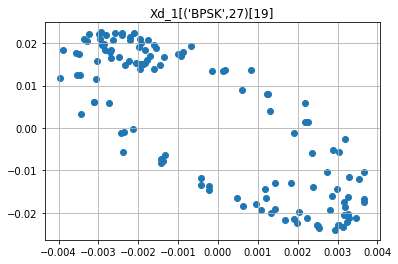

In [12]:
for i in range(20):
    x_values_radioml = list(Xd_1[('BPSK',27)][i][0])
    y_values_radioml = list(Xd_1[('BPSK',27)][i][1])
    plt.title(label = 'Xd_1[(\'BPSK\',27)[{0}]'.format(i))
    plt.scatter(x_values_radioml,y_values_radioml)
    plt.grid(b=True)
   
    plt.show()

In [13]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Reds, labelsA=[], labelsB=[]):
    #plt.cm.Reds - color shades to use, Reds, Blues, etc.
    # made the image bigger- 800x800
    #my_dpi=250
    
    #plt.figure(figsize=(800/my_dpi, 800/my_dpi), dpi=my_dpi)
    #key call- data, how to interpolate thefp vakues, color map
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    #adds a color legend to right hand side. Shows values for different shadings of blue.
    plt.colorbar()
    # create tickmarks with count = number of labels
    tick_marks = np.arange(len(labelsB))
    plt.xticks(tick_marks, labelsA, rotation=45)
    plt.yticks(tick_marks, labelsB)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

test_X_i.shape[0] :  2242
count :  265
test_X_i.shape[0] :  2222
count :  302
test_X_i.shape[0] :  2246
count :  369
test_X_i.shape[0] :  2206
count :  374
test_X_i.shape[0] :  2225
count :  425
test_X_i.shape[0] :  2279
count :  418
test_X_i.shape[0] :  2269
count :  430
test_X_i.shape[0] :  2278
count :  403
test_X_i.shape[0] :  2273
count :  410
test_X_i.shape[0] :  2256
count :  445
test_X_i.shape[0] :  2308
count :  399
test_X_i.shape[0] :  2233
count :  436
test_X_i.shape[0] :  2254
count :  399
test_X_i.shape[0] :  2237
count :  387
test_X_i.shape[0] :  2283
count :  423
test_X_i.shape[0] :  2272
count :  392
test_X_i.shape[0] :  2271
count :  402
test_X_i.shape[0] :  2236
count :  446


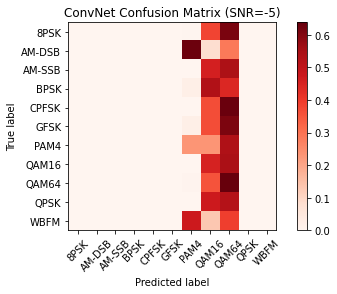

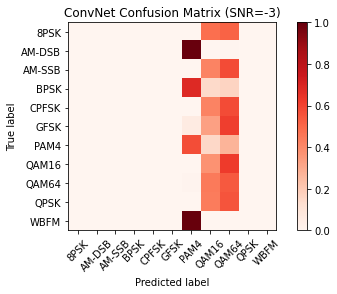

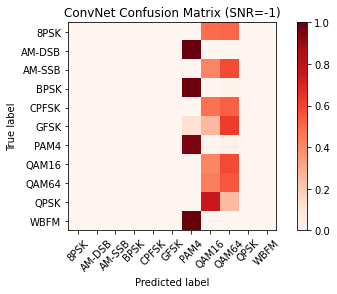

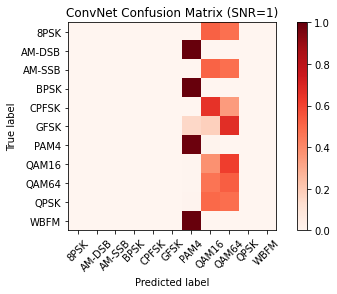

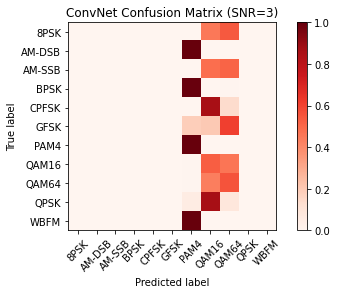

...

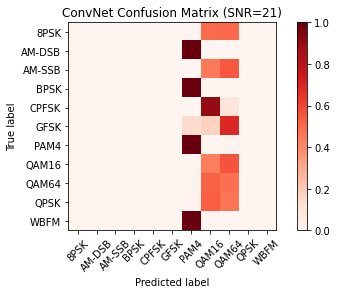

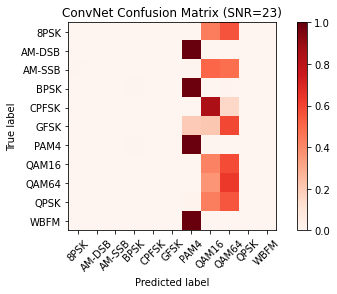

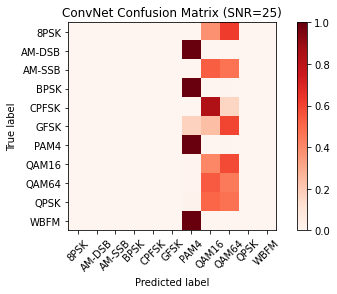

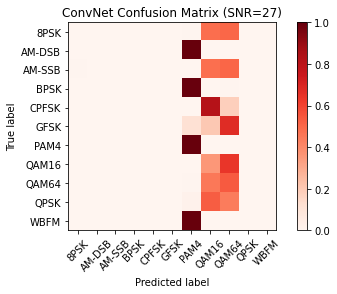

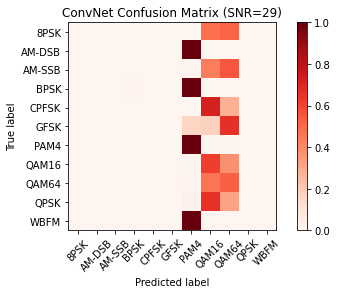

In [14]:
# Plot confusion matrix
acc = {}
count=0
#this create a new confusion matrix for each SNR
for snr in snrs_1:
    # extract classes @ SNR
    # USRP_IQ data를 snr에 따라서 배열한다
    test_SNRs = list(map(lambda x: lbl_1[x][1], test_1_idx))
    test_X_i = X_1_test[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = Y_1_test[np.where(np.array(test_SNRs)==snr)]    
 
    # USRP_IQ data의 class를 예측힌다
    test_Y_i_hat = model.predict(test_X_i)

    #create 11x11 matrix full of zeroes
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    print("test_X_i.shape[0] : ", test_X_i.shape[0])
    for i in range(0,test_X_i.shape[0]):
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        '''
        print('j : ', j)
        print('k : ', k)
        '''
        conf[j,k] = conf[j,k] + 1
        if k==j:
            count=count+1
    print("count : ", count)
    count=0
    
    #normalize 0 .. 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    plt.figure()
    
    plot_confusion_matrix(confnorm, labelsA=classes,labelsB=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
 
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    acc[snr] = 1.0*cor/(cor+ncor)


In [40]:
score = model.evaluate(X_1_test, Y_1_test, verbose=0, batch_size=batch_size)
print (score)

[11.921089879336925, 0.17553584277629852]


In [16]:
Xd_2 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_2.dat",'rb'),encoding="latin1")
print(Xd_2)
snrs_2,mods_2 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_2.keys())))), [1,0])
X_2 = [] 
lbl_2 = []
for mod in mods_2:
    for snr in snrs_2:
            X_2.append(Xd_2[(mod,snr)])
            for i in range(Xd_2[(mod,snr)].shape[0]):  
                lbl_2.append((mod,snr))
X_2 = np.vstack(X_2)
print(X_2.shape)

#arrayX에서 random하게 index를 뽑아 X_train과 X_test를 만든다
np.random.seed(2016)
n_examples = X_2.shape[0]
n_train = int(n_examples * 0.5)
test_2_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
X_2_test =  X_2[test_2_idx]
def to_onehot(yy):
    yy1 = np.zeros([len(yy), max(yy)+1])
    yy1[np.arange(len(yy)),yy] = 1
    return yy1

Y_2_test = to_onehot(list(map(lambda x: mods_2.index(lbl_2[x][0]), test_2_idx)))

{('AM-SSB', 3): array([[[-1.3582458e-04,  3.6221326e-03,  2.1903536e-03, ...,
          7.0087775e-03, -3.6880071e-03,  4.3603661e-03],
        [ 5.4269517e-04,  7.1177958e-04, -1.5355831e-03, ...,
         -1.3018947e-03,  3.8234799e-04, -1.3404142e-04]],

       [[-5.1569920e-03, -2.2278116e-03,  2.0657808e-03, ...,
         -1.5198182e-03,  2.6628834e-03,  5.5673782e-04],
        [-2.1937855e-03, -3.4941656e-03, -4.8642978e-03, ...,
          1.3673612e-03,  1.4278671e-03,  1.9727746e-04]],

       [[ 1.1068393e-03,  1.3319855e-03,  1.6535912e-03, ...,
         -3.9744386e-03,  4.7308672e-03, -3.2153323e-03],
        [-2.4667457e-03,  6.4129155e-04, -1.8063709e-03, ...,
          3.3611157e-03,  2.3275143e-03,  1.8982328e-03]],

       ...,

       [[-4.3620588e-03,  3.2028742e-03, -2.4887368e-03, ...,
          6.4746514e-03,  5.2201643e-04, -2.1483512e-03],
        [-1.3484181e-03, -3.5600387e-04,  3.5463283e-03, ...,
          4.2080651e-03, -1.3611410e-03, -1.3796982e-04]],

   

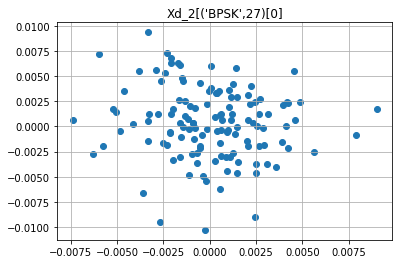

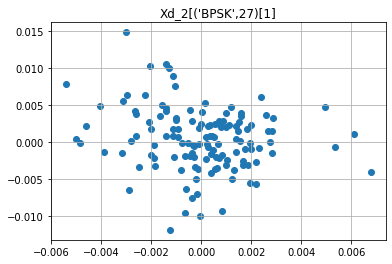

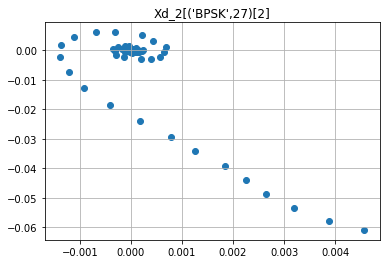

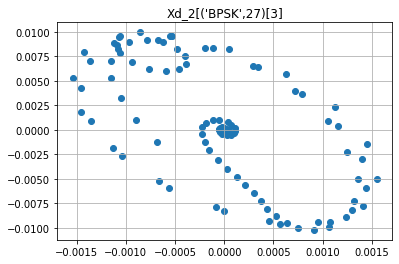

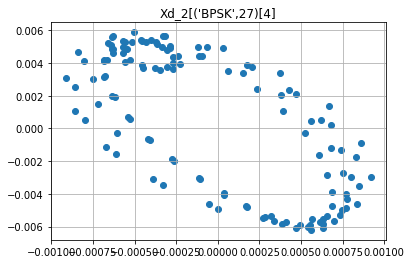

...

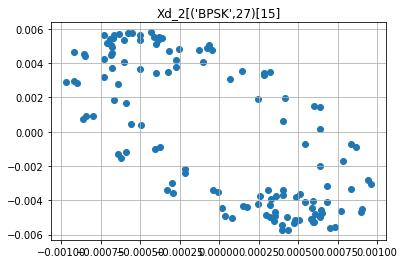

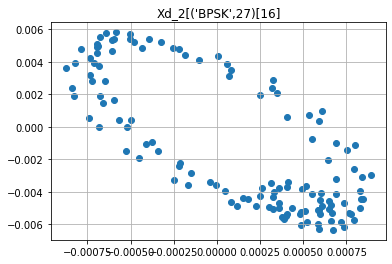

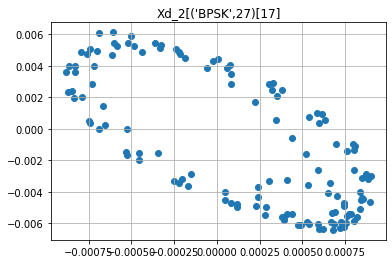

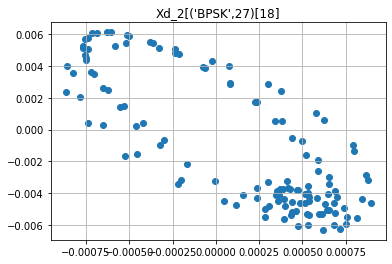

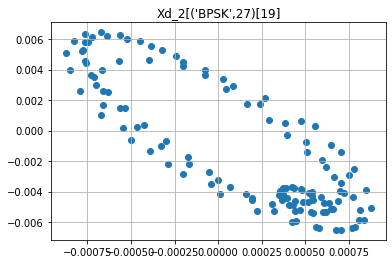

In [17]:
for i in range(20):
    x_values_radioml = list(Xd_2[('BPSK',27)][i][0])
    y_values_radioml = list(Xd_2[('BPSK',27)][i][1])
    plt.title(label = 'Xd_2[(\'BPSK\',27)[{0}]'.format(i))
    plt.scatter(x_values_radioml,y_values_radioml)
    plt.grid(b=True)
   
    plt.show()

In [18]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Reds, labelsA=[], labelsB=[]):
    #plt.cm.Reds - color shades to use, Reds, Blues, etc.
    # made the image bigger- 800x800
    #my_dpi=250
    
    #plt.figure(figsize=(800/my_dpi, 800/my_dpi), dpi=my_dpi)
    #key call- data, how to interpolate thefp vakues, color map
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    #adds a color legend to right hand side. Shows values for different shadings of blue.
    plt.colorbar()
    # create tickmarks with count = number of labels
    tick_marks = np.arange(len(labelsB))
    plt.xticks(tick_marks, labelsA, rotation=45)
    plt.yticks(tick_marks, labelsB)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

test_X_i.shape[0] :  2232
count :  206
test_X_i.shape[0] :  2258
count :  433
test_X_i.shape[0] :  2250
count :  734
test_X_i.shape[0] :  2210
count :  806
test_X_i.shape[0] :  2257
count :  767
test_X_i.shape[0] :  2253
count :  969
test_X_i.shape[0] :  2329
count :  922
test_X_i.shape[0] :  2236
count :  1039
test_X_i.shape[0] :  2280
count :  1006
test_X_i.shape[0] :  2270
count :  862
test_X_i.shape[0] :  2277
count :  994
test_X_i.shape[0] :  2219
count :  955
test_X_i.shape[0] :  2247
count :  981
test_X_i.shape[0] :  2322
count :  926
test_X_i.shape[0] :  2286
count :  979
test_X_i.shape[0] :  2249
count :  953
test_X_i.shape[0] :  2304
count :  1063
test_X_i.shape[0] :  2210
count :  886


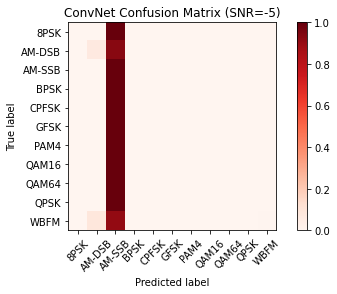

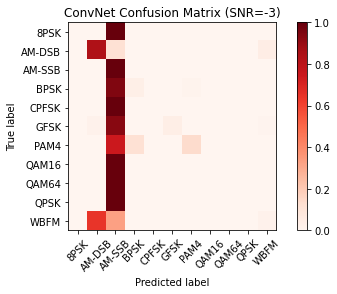

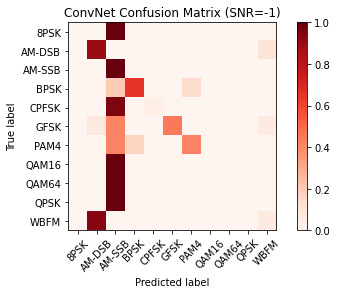

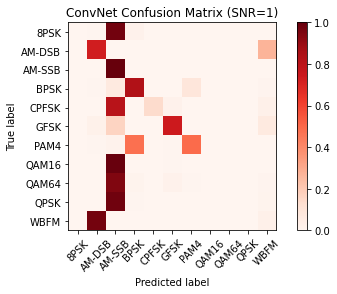

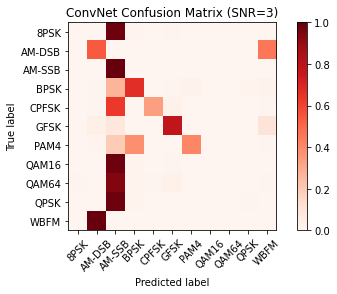

...

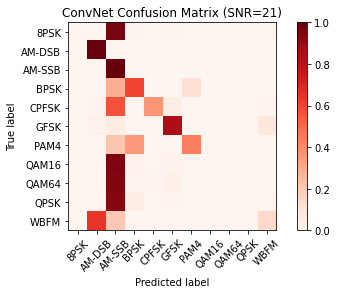

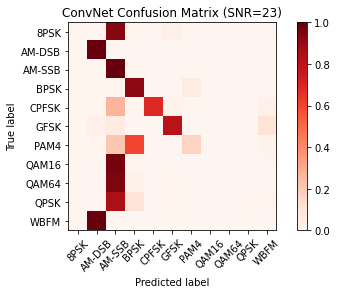

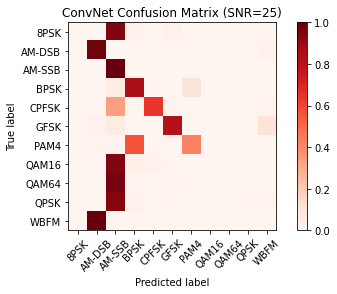

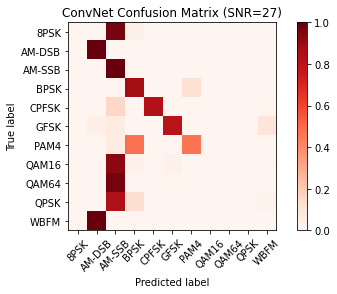

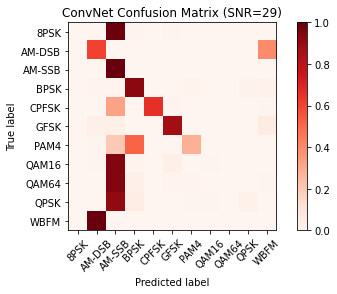

In [19]:
# Plot confusion matrix
acc = {}
count=0
#this create a new confusion matrix for each SNR
for snr in snrs_2:
    # extract classes @ SNR
    # USRP_IQ data를 snr에 따라서 배열한다
    test_SNRs = list(map(lambda x: lbl_2[x][1], test_2_idx))
    test_X_i = X_2_test[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = Y_2_test[np.where(np.array(test_SNRs)==snr)]    
 
    # USRP_IQ data의 class를 예측힌다
    test_Y_i_hat = model.predict(test_X_i)

    #create 11x11 matrix full of zeroes
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    print("test_X_i.shape[0] : ", test_X_i.shape[0])
    for i in range(0,test_X_i.shape[0]):
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        '''
        print('j : ', j)
        print('k : ', k)
        '''
        conf[j,k] = conf[j,k] + 1
        if k==j:
            count=count+1
    print("count : ", count)
    count=0
    
    #normalize 0 .. 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    plt.figure()
    
    plot_confusion_matrix(confnorm, labelsA=classes,labelsB=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
 
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    acc[snr] = 1.0*cor/(cor+ncor)


In [39]:
score = model.evaluate(X_2_test, Y_2_test, verbose=0, batch_size=batch_size)
print (score)

[3.0538589255333815, 0.3804713785648346]


In [21]:
Xd_3 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_0.25.dat",'rb'),encoding="latin1")
print(Xd_3)
snrs_3,mods_3 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_3.keys())))), [1,0])
X_3 = [] 
lbl_3 = []
for mod in mods_3:
    for snr in snrs_3:
            X_3.append(Xd_3[(mod,snr)])
            for i in range(Xd_3[(mod,snr)].shape[0]):  
                lbl_3.append((mod,snr))
X_3 = np.vstack(X_3)
print(X_3.shape)

#arrayX에서 random하게 index를 뽑아 X_train과 X_test를 만든다
np.random.seed(2016)
n_examples = X_3.shape[0]
n_train = int(n_examples * 0.5)
test_3_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
X_3_test =  X_3[test_3_idx]
def to_onehot(yy):
    yy1 = np.zeros([len(yy), max(yy)+1])
    yy1[np.arange(len(yy)),yy] = 1
    return yy1

Y_3_test = to_onehot(list(map(lambda x: mods_3.index(lbl_3[x][0]), test_3_idx)))

{('AM-SSB', 3): array([[[-0.00110977, -0.0216155 , -0.02267291, ...,  0.03078532,
         -0.02288231, -0.00575898],
        [ 0.03321456,  0.01323732, -0.01420679, ..., -0.02963065,
         -0.04722723, -0.01588572]],

       [[ 0.00695409,  0.0523496 , -0.02754627, ..., -0.02760384,
          0.00610178,  0.03595988],
        [-0.05011989, -0.00972404,  0.00285581, ...,  0.01670747,
         -0.0057189 ,  0.01991514]],

       [[ 0.00309359, -0.01154528,  0.02022856, ..., -0.00473856,
         -0.03106137,  0.02331864],
        [ 0.02140039,  0.01038714,  0.01084677, ..., -0.01030361,
          0.02519817, -0.0023414 ]],

       ...,

       [[-0.01257572, -0.02230503,  0.00499393, ..., -0.00456924,
          0.00485904, -0.02948029],
        [-0.00577564, -0.01008006,  0.02134572, ...,  0.04453856,
          0.01290179, -0.00956715]],

       [[-0.02521357, -0.01321272, -0.01203816, ...,  0.01073008,
         -0.01126388, -0.00054968],
        [-0.0407433 , -0.03811864, -0.0296782

test_X_i.shape[0] :  2232
count :  223
test_X_i.shape[0] :  2258
count :  334
test_X_i.shape[0] :  2250
count :  375
test_X_i.shape[0] :  2210
count :  404
test_X_i.shape[0] :  2257
count :  408
test_X_i.shape[0] :  2253
count :  400
test_X_i.shape[0] :  2329
count :  413
test_X_i.shape[0] :  2236
count :  398
test_X_i.shape[0] :  2280
count :  381
test_X_i.shape[0] :  2270
count :  422
test_X_i.shape[0] :  2277
count :  416
test_X_i.shape[0] :  2219
count :  376
test_X_i.shape[0] :  2247
count :  402
test_X_i.shape[0] :  2322
count :  426
test_X_i.shape[0] :  2286
count :  411
test_X_i.shape[0] :  2249
count :  422
test_X_i.shape[0] :  2304
count :  419
test_X_i.shape[0] :  2210
count :  383


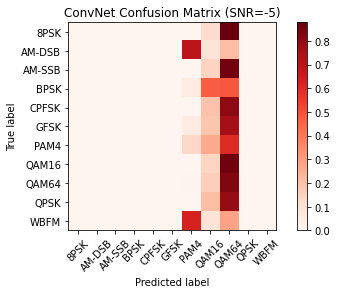

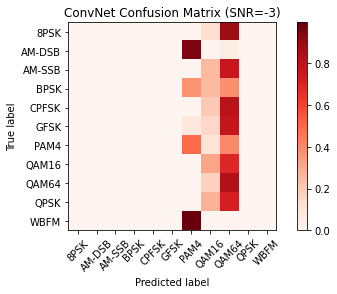

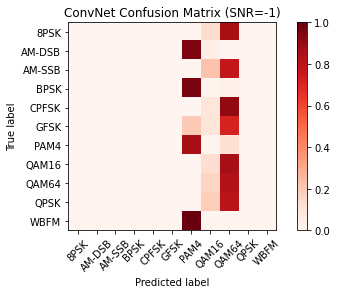

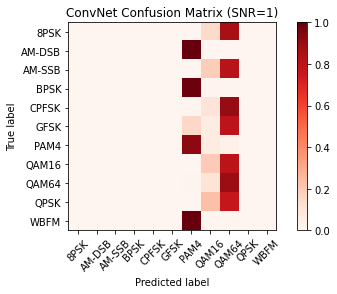

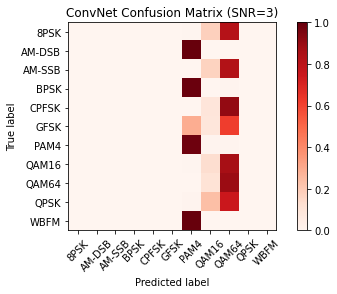

...

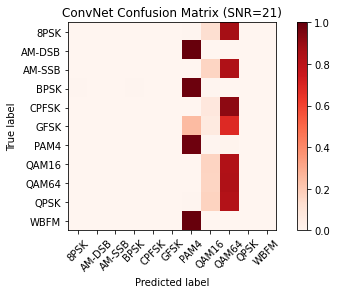

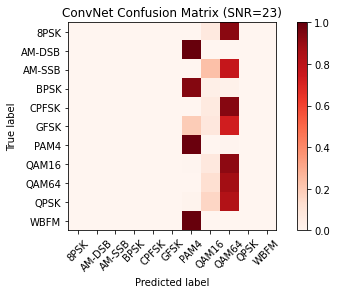

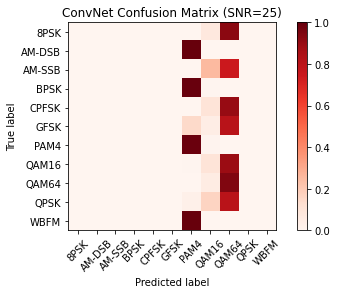

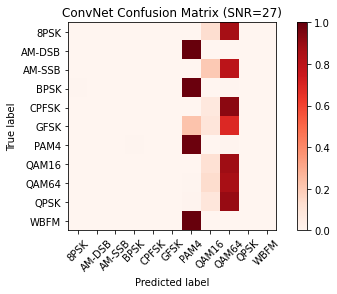

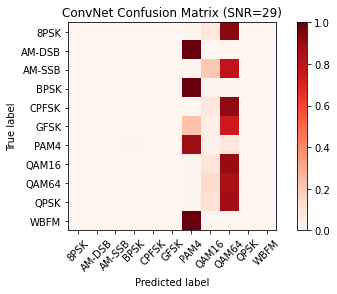

In [22]:
# Plot confusion matrix
acc = {}
count=0
#this create a new confusion matrix for each SNR
for snr in snrs_3:
    # extract classes @ SNR
    # USRP_IQ data를 snr에 따라서 배열한다
    test_SNRs = list(map(lambda x: lbl_3[x][1], test_3_idx))
    test_X_i = X_3_test[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = Y_3_test[np.where(np.array(test_SNRs)==snr)]    
 
    # USRP_IQ data의 class를 예측힌다
    test_Y_i_hat = model.predict(test_X_i)

    #create 11x11 matrix full of zeroes
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    print("test_X_i.shape[0] : ", test_X_i.shape[0])
    for i in range(0,test_X_i.shape[0]):
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        '''
        print('j : ', j)
        print('k : ', k)
        '''
        conf[j,k] = conf[j,k] + 1
        if k==j:
            count=count+1
    print("count : ", count)
    count=0
    
    #normalize 0 .. 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    plt.figure()
    
    plot_confusion_matrix(confnorm, labelsA=classes,labelsB=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
 
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    acc[snr] = 1.0*cor/(cor+ncor)

In [37]:
score = model.evaluate(X_3_test, Y_3_test, verbose=0, batch_size=batch_size)
print (score)

[12.238144335894074, 0.17235615849494934]


In [24]:
Xd_4 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_1.5.dat",'rb'),encoding="latin1")
print(Xd_4)
snrs_4,mods_4 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_4.keys())))), [1,0])
X_4 = [] 
lbl_4 = []
for mod in mods_4:
    for snr in snrs_4:
            X_4.append(Xd_4[(mod,snr)])
            for i in range(Xd_4[(mod,snr)].shape[0]):  
                lbl_4.append((mod,snr))
X_4 = np.vstack(X_4)
print(X_4.shape)

#arrayX에서 random하게 index를 뽑아 X_train과 X_test를 만든다
np.random.seed(2016)
n_examples = X_4.shape[0]
n_train = int(n_examples * 0.5)
test_4_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
X_4_test =  X_4[test_4_idx]
def to_onehot(yy):
    yy1 = np.zeros([len(yy), max(yy)+1])
    yy1[np.arange(len(yy)),yy] = 1
    return yy1

Y_4_test = to_onehot(list(map(lambda x: mods_4.index(lbl_4[x][0]), test_4_idx)))

{('AM-SSB', 3): array([[[-0.00467253, -0.00022115,  0.00426746, ..., -0.00359091,
          0.00017435,  0.00173939],
        [ 0.00220943,  0.00138242, -0.00418881, ...,  0.00360565,
         -0.00873662,  0.00226189]],

       [[-0.00199249,  0.00256713,  0.00200438, ...,  0.00402707,
         -0.00157052, -0.0168491 ],
        [-0.0008279 , -0.00325481,  0.00612035, ...,  0.01185114,
         -0.00317497,  0.00608133]],

       [[ 0.00203647,  0.00376785,  0.00251684, ...,  0.00340454,
         -0.00110898, -0.00532296],
        [ 0.00425945,  0.00278426,  0.00472914, ...,  0.00494625,
          0.0053639 ,  0.00330051]],

       ...,

       [[-0.0020278 , -0.0101346 , -0.00183661, ..., -0.00260612,
         -0.00456726, -0.00055231],
        [ 0.00391251, -0.00522509,  0.00046447, ..., -0.00176747,
          0.00131166,  0.00655134]],

       [[ 0.00177492, -0.00260796, -0.0028788 , ...,  0.00143395,
          0.0019451 ,  0.00220142],
        [ 0.00049832,  0.0004655 , -0.0010913

test_X_i.shape[0] :  2232
count :  406
test_X_i.shape[0] :  2258
count :  1009
test_X_i.shape[0] :  2250
count :  1318
test_X_i.shape[0] :  2210
count :  1409
test_X_i.shape[0] :  2257
count :  1480
test_X_i.shape[0] :  2253
count :  1425
test_X_i.shape[0] :  2329
count :  1580
test_X_i.shape[0] :  2236
count :  1486
test_X_i.shape[0] :  2280
count :  1486
test_X_i.shape[0] :  2270
count :  1415
test_X_i.shape[0] :  2277
count :  1449
test_X_i.shape[0] :  2219
count :  1499
test_X_i.shape[0] :  2247
count :  1527
test_X_i.shape[0] :  2322
count :  1466
test_X_i.shape[0] :  2286
count :  1527
test_X_i.shape[0] :  2249
count :  1589
test_X_i.shape[0] :  2304
count :  1603
test_X_i.shape[0] :  2210
count :  1477


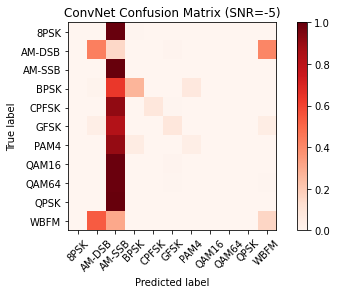

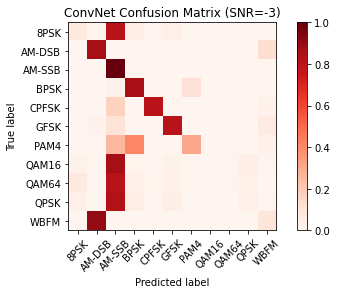

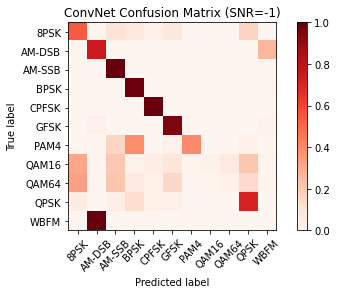

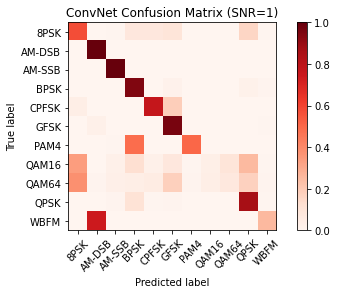

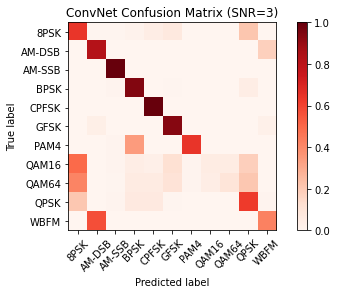

...

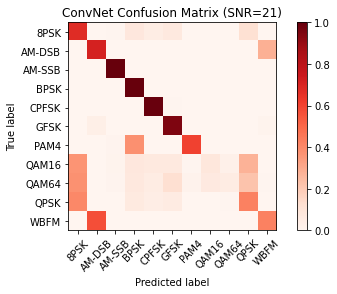

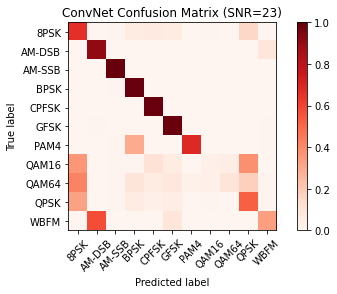

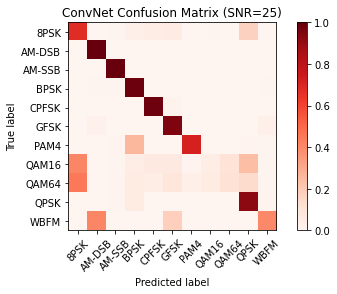

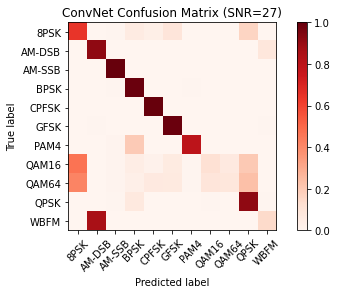

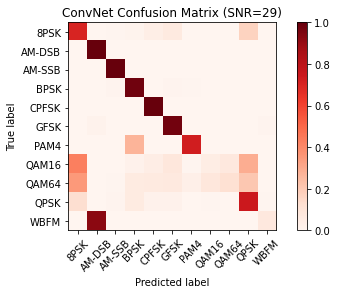

In [25]:
# Plot confusion matrix
acc = {}
count=0
#this create a new confusion matrix for each SNR
for snr in snrs_4:
    # extract classes @ SNR
    # USRP_IQ data를 snr에 따라서 배열한다
    test_SNRs = list(map(lambda x: lbl_4[x][1], test_4_idx))
    test_X_i = X_4_test[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = Y_4_test[np.where(np.array(test_SNRs)==snr)]    
 
    # USRP_IQ data의 class를 예측힌다
    test_Y_i_hat = model.predict(test_X_i)

    #create 11x11 matrix full of zeroes
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    print("test_X_i.shape[0] : ", test_X_i.shape[0])
    for i in range(0,test_X_i.shape[0]):
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        '''
        print('j : ', j)
        print('k : ', k)
        '''
        conf[j,k] = conf[j,k] + 1
        if k==j:
            count=count+1
    print("count : ", count)
    count=0
    
    #normalize 0 .. 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    plt.figure()
    
    plot_confusion_matrix(confnorm, labelsA=classes,labelsB=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
 
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    acc[snr] = 1.0*cor/(cor+ncor)

In [38]:
score = model.evaluate(X_4_test, Y_4_test, verbose=0, batch_size=batch_size)
print (score)

[1.1722059913352965, 0.6181277632713318]


In [27]:
Xd_5 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_1.25.dat",'rb'),encoding="latin1")
print(Xd_5)
snrs_5,mods_5 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_5.keys())))), [1,0])
X_5 = [] 
lbl_5 = []
for mod in mods_5:
    for snr in snrs_5:
            X_5.append(Xd_5[(mod,snr)])
            for i in range(Xd_5[(mod,snr)].shape[0]):  
                lbl_5.append((mod,snr))
X_5 = np.vstack(X_5)
print(X_5.shape)

#arrayX에서 random하게 index를 뽑아 X_train과 X_test를 만든다
np.random.seed(2016)
n_examples = X_5.shape[0]
n_train = int(n_examples * 0.5)
test_5_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
X_5_test =  X_2[test_5_idx]
def to_onehot(yy):
    yy1 = np.zeros([len(yy), max(yy)+1])
    yy1[np.arange(len(yy)),yy] = 1
    return yy1

Y_5_test = to_onehot(list(map(lambda x: mods_5.index(lbl_5[x][0]), test_5_idx)))

{('AM-SSB', 3): array([[[-2.5577364e-03,  9.5148192e-04, -2.3507446e-03, ...,
         -5.8113607e-03, -7.3709278e-03,  4.1769999e-03],
        [-3.5749250e-03, -7.3894895e-05,  2.5936537e-03, ...,
         -5.4076072e-03, -3.9815647e-03, -2.1172890e-03]],

       [[ 2.7378986e-03,  2.5190751e-03,  4.3528206e-03, ...,
         -1.4361754e-02,  6.3742255e-03, -4.7874814e-03],
        [-3.9174506e-03,  6.3465796e-03, -5.0230039e-04, ...,
         -3.2644034e-03, -5.7903854e-03,  4.9431981e-03]],

       [[-2.4566150e-03, -1.5500057e-04, -3.8506705e-04, ...,
          1.2584974e-03, -9.1027527e-04, -3.8204181e-03],
        [-9.3089659e-03,  6.6636633e-03, -2.4325412e-03, ...,
         -9.0225898e-03, -8.9606773e-03,  7.9955207e-04]],

       ...,

       [[ 6.0121999e-03,  7.5667072e-03,  8.8809319e-03, ...,
          1.4538724e-03, -2.7251265e-03, -2.4197805e-03],
        [-4.1200784e-03,  1.0722547e-03, -2.9304754e-03, ...,
         -6.5997052e-03, -4.8338370e-03,  4.3393119e-04]],

   

test_X_i.shape[0] :  2242
count :  190
acc[snr] :  0.0847457627118644
test_X_i.shape[0] :  2222
count :  401
acc[snr] :  0.18046804680468045
test_X_i.shape[0] :  2246
count :  713
acc[snr] :  0.317453250222618
test_X_i.shape[0] :  2206
count :  788
acc[snr] :  0.357207615593835
test_X_i.shape[0] :  2225
count :  799
acc[snr] :  0.3591011235955056
test_X_i.shape[0] :  2279
count :  925
acc[snr] :  0.4058797718297499
test_X_i.shape[0] :  2269
count :  904
acc[snr] :  0.39841339797267517
test_X_i.shape[0] :  2278
count :  999
acc[snr] :  0.4385425812115891
test_X_i.shape[0] :  2273
count :  1027
acc[snr] :  0.4518257809062912
test_X_i.shape[0] :  2256
count :  905
acc[snr] :  0.40115248226950356
test_X_i.shape[0] :  2308
count :  900
acc[snr] :  0.389948006932409
test_X_i.shape[0] :  2233
count :  1034
acc[snr] :  0.4630541871921182
test_X_i.shape[0] :  2254
count :  978
acc[snr] :  0.4338952972493345
test_X_i.shape[0] :  2237
count :  923
acc[snr] :  0.41260616897630753
test_X_i.shape[0]

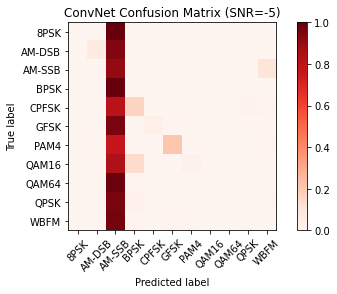

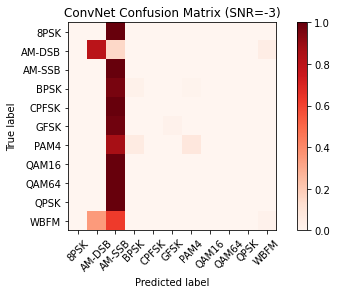

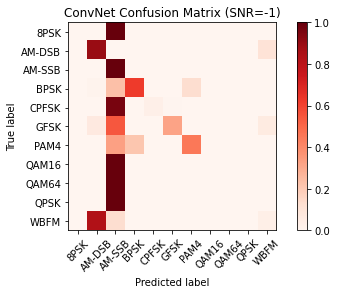

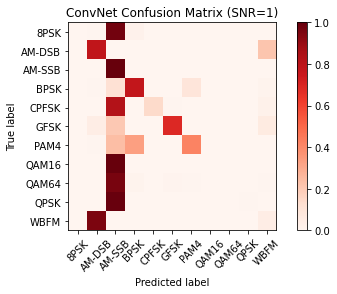

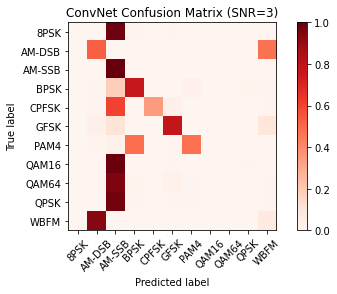

...

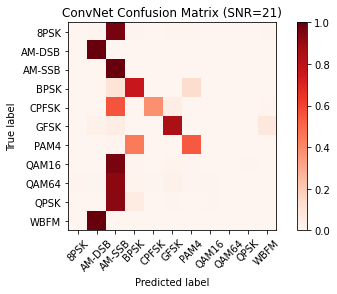

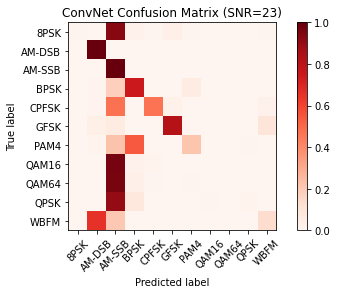

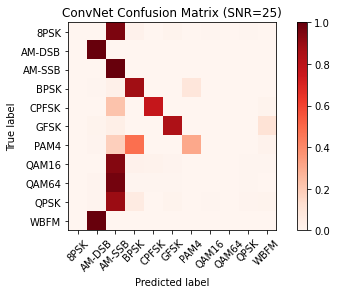

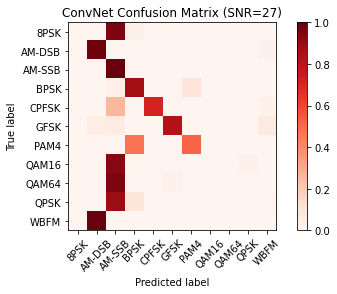

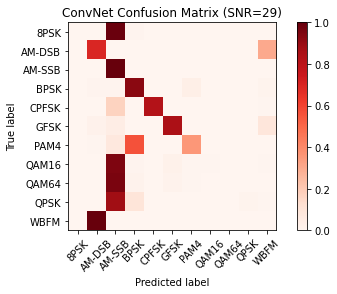

In [28]:
# Plot confusion matrix
acc = {}
count=0
#this create a new confusion matrix for each SNR
for snr in snrs_5:
    # extract classes @ SNR
    # USRP_IQ data를 snr에 따라서 배열한다
    test_SNRs = list(map(lambda x: lbl_5[x][1], test_5_idx))
    test_X_i = X_5_test[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = Y_5_test[np.where(np.array(test_SNRs)==snr)]    
 
    # USRP_IQ data의 class를 예측힌다
    test_Y_i_hat = model.predict(test_X_i)

    #create 11x11 matrix full of zeroes
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    print("test_X_i.shape[0] : ", test_X_i.shape[0])
    for i in range(0,test_X_i.shape[0]):
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        '''
        print('j : ', j)
        print('k : ', k)
        '''
        conf[j,k] = conf[j,k] + 1
        if k==j:
            count=count+1
    print("count : ", count)
    count=0
    
    #normalize 0 .. 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    plt.figure()
    
    plot_confusion_matrix(confnorm, labelsA=classes,labelsB=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
 
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    acc[snr] = 1.0*cor/(cor+ncor)
    print("acc[snr] : ", acc[snr])

In [36]:
score = model.evaluate(X_5_test, Y_5_test, verbose=0, batch_size=batch_size)
print (score)

[3.1272288739725296, 0.37893569469451904]


(411, 2, 128)


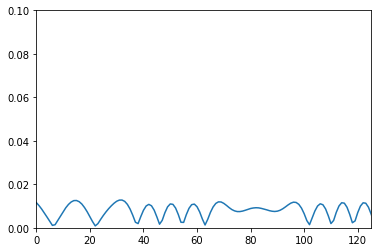

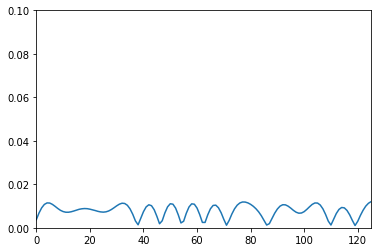

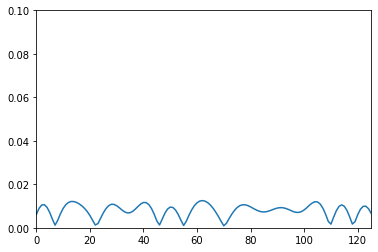

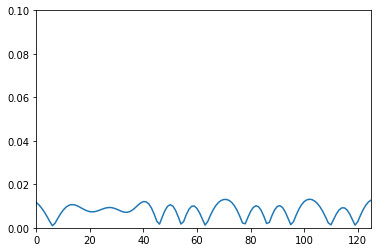

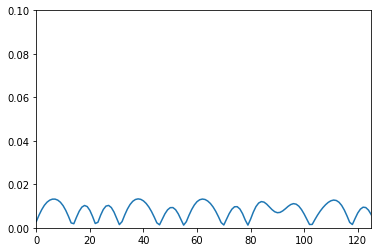

...

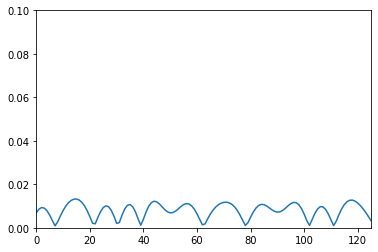

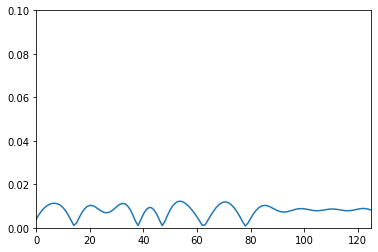

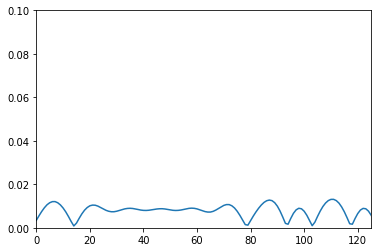

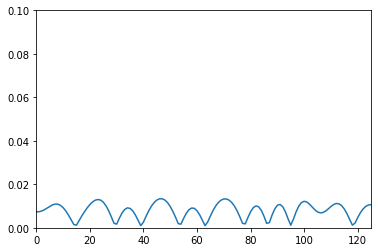

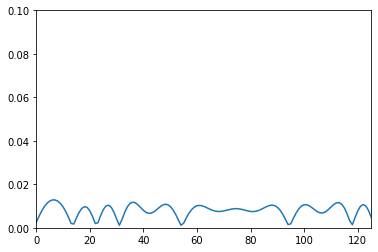

'\nprint(X_BPSK)\nprint(X_BPSK_I)\nprint(X_BPSK_Q)\n'

In [30]:
Xd_impulse = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_default.dat",'rb'),encoding="latin1")
snrs_impulse,mods_impulse = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_impulse.keys())))), [1,0])
X_BPSK = [] 
lbl_impulse = []
for mod in mods_impulse:
    if mod == 'BPSK':
        for snr in snrs_impulse:
            if snr==27:
                X_BPSK.append(Xd_impulse[(mod,snr)])
                for i in range(Xd_impulse[(mod,snr)].shape[0]):  
                    lbl_impulse.append((mod,snr))
X_BPSK = np.vstack(X_BPSK)
print(X_BPSK.shape)

X_BPSK_I=[]
X_BPSK_Q=[]

for i in range(25,75):
    X_BPSK_I=X_BPSK[i][0]
    X_BPSK_Q=X_BPSK[i][1]
    combined = X_BPSK_I + 1j * X_BPSK_Q
    plt.plot(np.abs(combined))
    plt.axis([0, 125, 0, 0.1])
    plt.show()
    

'''
print(X_BPSK)
print(X_BPSK_I)
print(X_BPSK_Q)
'''


(410, 2, 128)


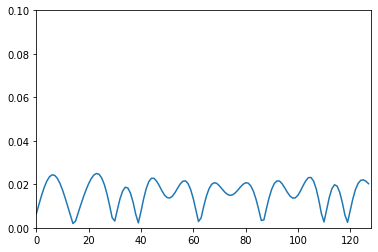

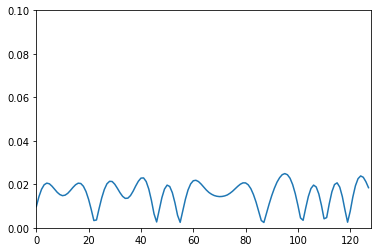

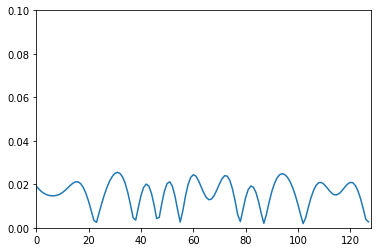

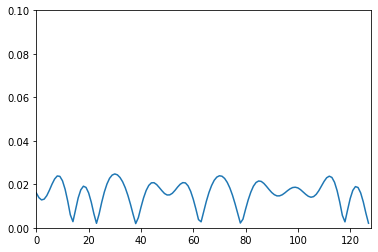

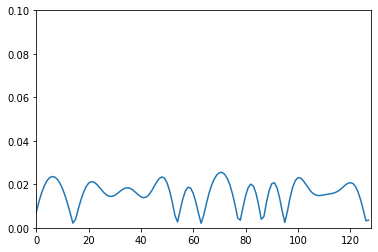

...

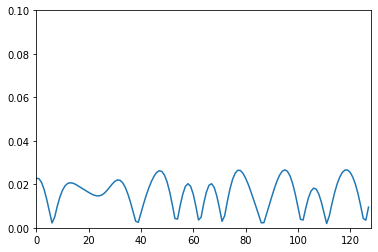

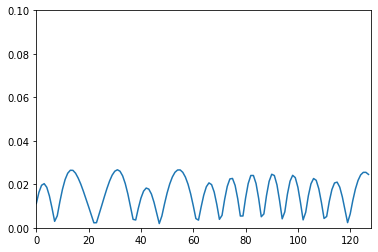

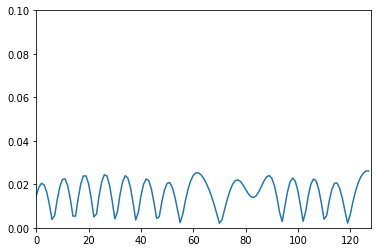

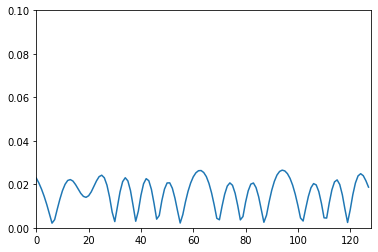

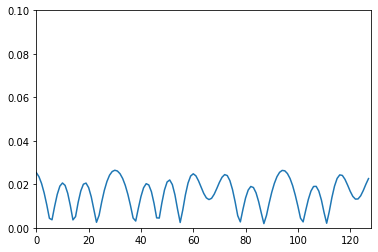

In [31]:
Xd_1 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_0.5.dat",'rb'),encoding="latin1")
snrs_1,mods_1 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_1.keys())))), [1,0])
X_1 = [] 
lbl_1 = []
for mod in mods_1:
    if mod == 'BPSK':
        for snr in snrs_1:
            if snr==27:
                X_1.append(Xd_1[(mod,snr)])
                for i in range(Xd_1[(mod,snr)].shape[0]):  
                    lbl_1.append((mod,snr))
X_1 = np.vstack(X_1)
print(X_1.shape)

X_1_I=[]
X_1_Q=[]

for i in range(25,75):
    X_1_I=X_1[i][0]
    X_1_Q=X_1[i][1]
    combined = X_1_I + 1j * X_1_Q
    plt.plot(np.abs(combined))
    plt.axis([0, 128, 0, 0.1])
    plt.show()

(411, 2, 128)


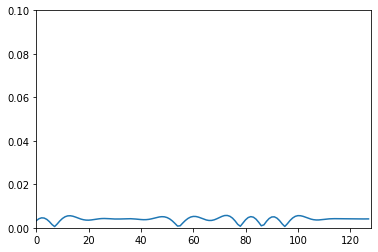

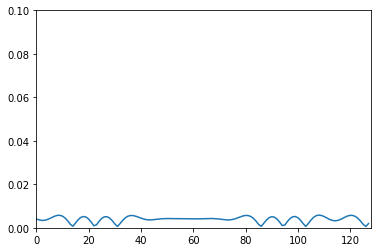

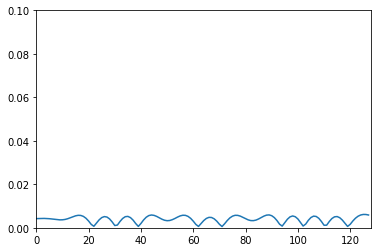

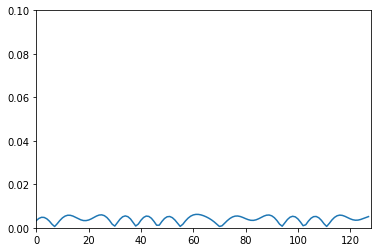

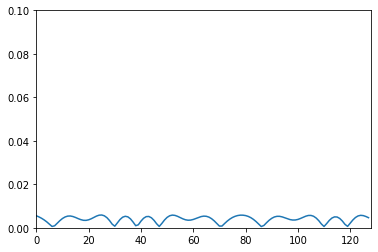

...

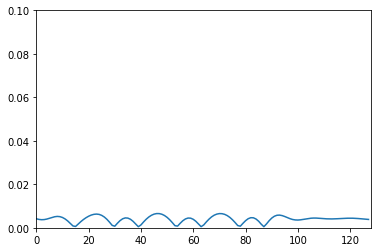

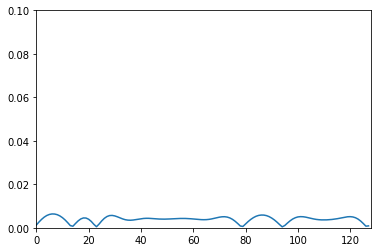

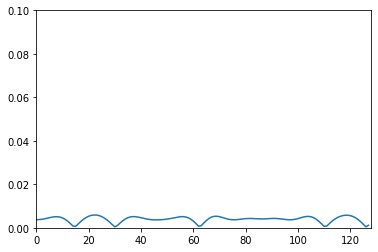

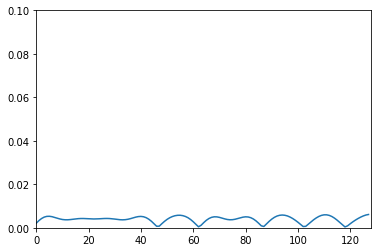

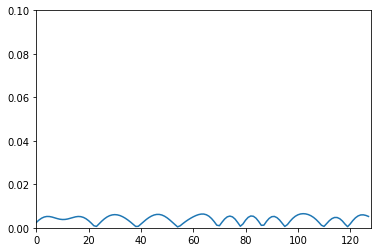

In [32]:
Xd_2 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_2.dat",'rb'),encoding="latin1")
snrs_2,mods_2 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_2.keys())))), [1,0])
X_2 = [] 
lbl_2 = []
for mod in mods_2:
    if mod == 'BPSK':
        for snr in snrs_2:
            if snr==27:
                X_2.append(Xd_2[(mod,snr)])
                for i in range(Xd_2[(mod,snr)].shape[0]):  
                    lbl_2.append((mod,snr))
X_2 = np.vstack(X_2)
print(X_2.shape)

X_2_I=[]
X_2_Q=[]

for i in range(25,75):
    X_2_I=X_2[i][0]
    X_2_Q=X_2[i][1]
    combined = X_2_I + 1j * X_2_Q
    plt.plot(np.abs(combined))
    plt.axis([0, 128, 0, 0.1])
    plt.show()

(411, 2, 128)


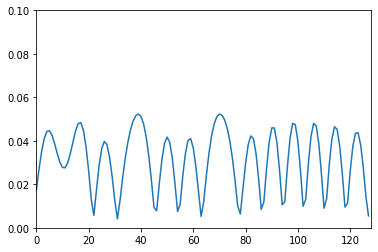

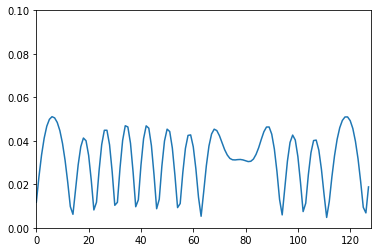

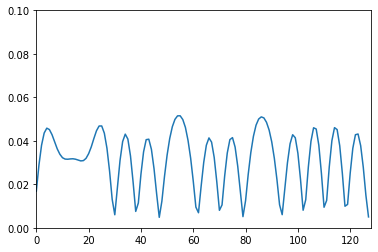

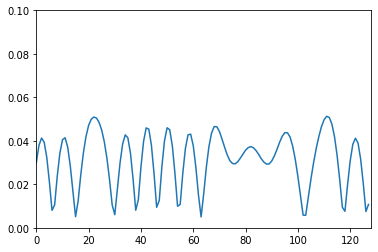

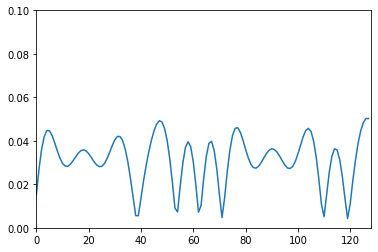

...

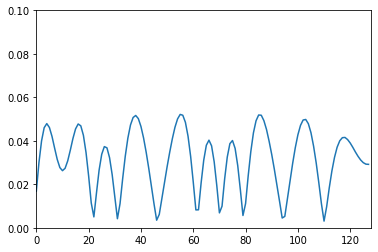

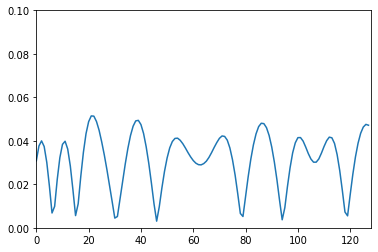

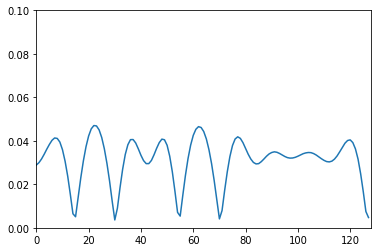

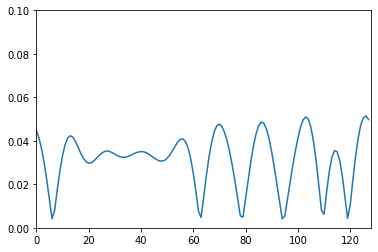

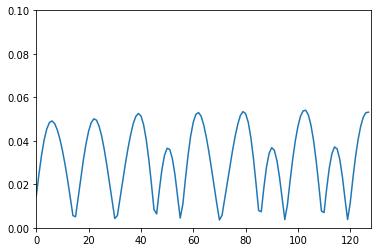

In [33]:
Xd_3 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_0.25.dat",'rb'),encoding="latin1")
snrs_3,mods_3 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_3.keys())))), [1,0])
X_3 = [] 
lbl_3= []
for mod in mods_3:
    if mod == 'BPSK':
        for snr in snrs_3:
            if snr==27:
                X_3.append(Xd_3[(mod,snr)])
                for i in range(Xd_3[(mod,snr)].shape[0]):  
                    lbl_3.append((mod,snr))
X_3 = np.vstack(X_3)
print(X_3.shape)

X_3_I=[]
X_3_Q=[]

for i in range(25,75):
    X_3_I=X_3[i][0]
    X_3_Q=X_3[i][1]
    combined = X_3_I + 1j * X_3_Q
    plt.plot(np.abs(combined))
    plt.axis([0, 128, 0, 0.1])
    plt.show()

(411, 2, 128)


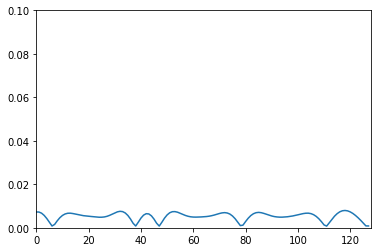

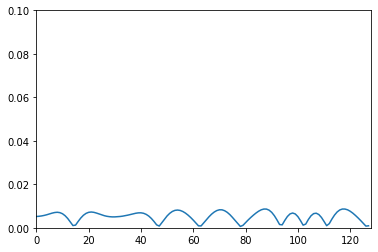

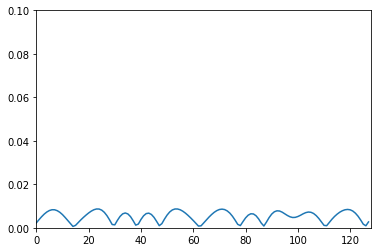

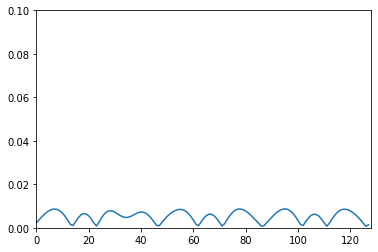

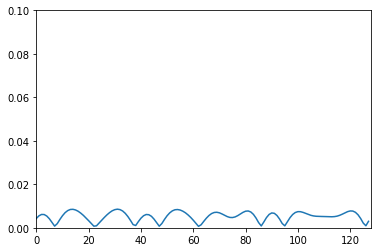

...

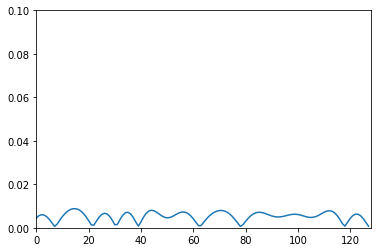

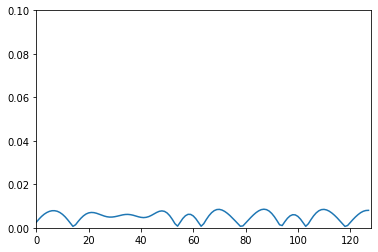

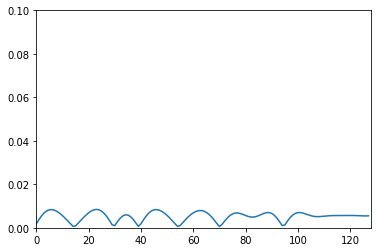

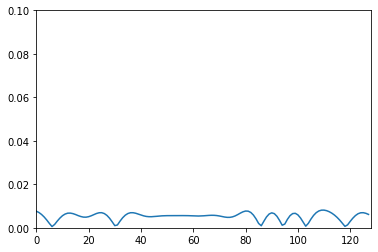

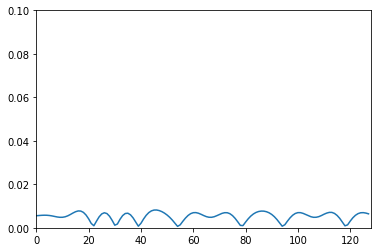

In [34]:
Xd_4 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_1.5.dat",'rb'),encoding="latin1")
snrs_4,mods_4 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_4.keys())))), [1,0])
X_4 = [] 
lbl_4 = []
for mod in mods_4:
    if mod == 'BPSK':
        for snr in snrs_4:
            if snr==27:
                X_4.append(Xd_4[(mod,snr)])
                for i in range(Xd_4[(mod,snr)].shape[0]):  
                    lbl_4.append((mod,snr))
X_4 = np.vstack(X_4)
print(X_4.shape)

X_4_I=[]
X_4_Q=[]

for i in range(25,75):
    X_4_I=X_4[i][0]
    X_4_Q=X_4[i][1]
    combined = X_4_I + 1j * X_4_Q
    plt.plot(np.abs(combined))
    plt.axis([0, 128, 0, 0.1])
    plt.show()

(410, 2, 128)


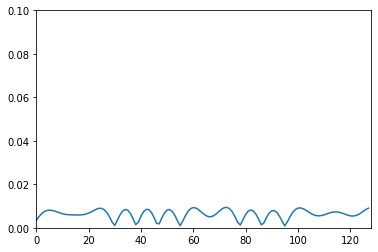

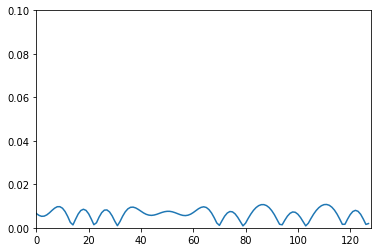

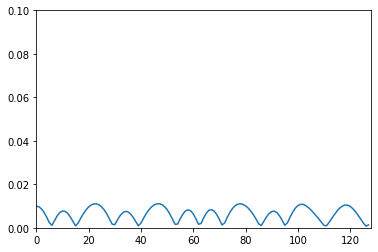

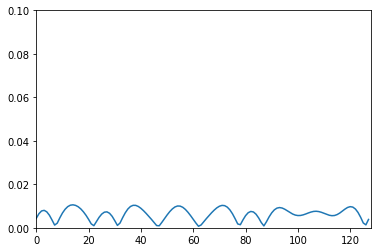

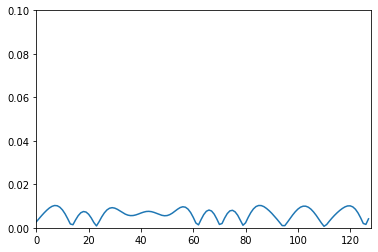

...

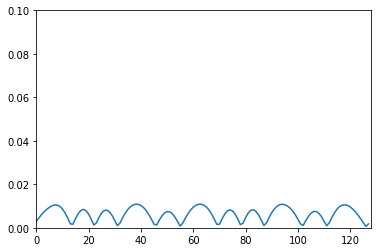

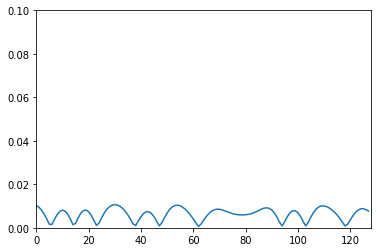

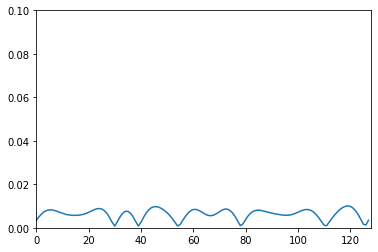

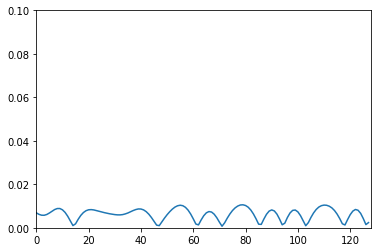

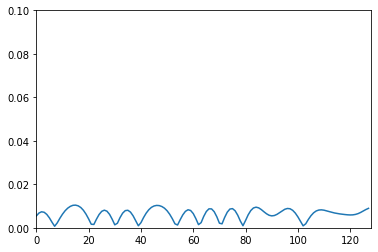

In [35]:
Xd_5 = cPickle.load(open("/root/dataset/RML2014.04c_dict_IQ_1.25.dat",'rb'),encoding="latin1")
snrs_5,mods_5 = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd_5.keys())))), [1,0])
X_5 = [] 
lbl_5 = []
for mod in mods_5:
    if mod == 'BPSK':
        for snr in snrs_5:
            if snr==27:
                X_5.append(Xd_5[(mod,snr)])
                for i in range(Xd_5[(mod,snr)].shape[0]):  
                    lbl_5.append((mod,snr))
X_5 = np.vstack(X_5)
print(X_5.shape)

X_5_I=[]
X_5_Q=[]

for i in range(25,75):
    X_5_I=X_5[i][0]
    X_5_Q=X_5[i][1]
    combined = X_5_I + 1j * X_5_Q
    plt.plot(np.abs(combined))
    plt.axis([0, 128, 0, 0.1])
    plt.show()